# <a id='toc1_'></a>[Digital signal processing. Lab4](#toc0_)

**Table of contents**<a id='toc0_'></a>    
- [Digital signal processing. Lab4](#toc1_)    
  - [Task1](#toc1_1_)    
  - [Task2](#toc1_2_)    
  - [Task3](#toc1_3_)    
  - [Task4](#toc1_4_)    
  - [Task5](#toc1_5_)    
  - [Task6](#toc1_6_)    
  - [Task7](#toc1_7_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

## <a id='toc1_1_'></a>[Task1](#toc0_)

На вход передатчика подается некоторый сигнал во времени. *(В качестве сигнала возможно рассмотреть сигнал прямоугольных периодических импульсов).*

Реализовать свертку сигнала с некоторым ядром во временной области.
В качестве ядра свертки использовать:
    
* a) $y = A \cdot \exp(-x^2)$
* б) любую линейную функцию.

**Замечание:** Для реализации свертки можно использовать готовую встроенную функцию numpy: `convolve(signal, kernel)`.

In [2]:
import numpy as np
import matplotlib.pyplot as plt

plt.style.use('fivethirtyeight')

In [3]:
T_1 = 2 # signal period
f_1 = 1/T_1         
A_1 = 2.0   
Fs_1 = 300 # sampling rate
dt_1 = 1.0 / Fs_1          
w_1 = 2 * np.pi * f_1

meandr = lambda t: A_1 * np.sign(np.sin(w_1 * t))

In [4]:
t_vals_1 = np.arange(0, 10, dt_1)
signal_y_vals_1 = meandr(t_vals_1)

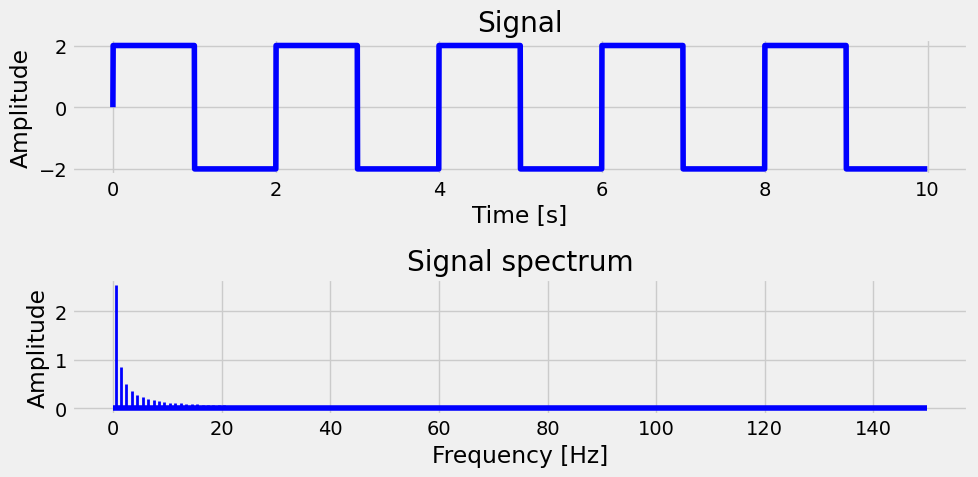

In [5]:
spectrum = np.fft.fft(signal_y_vals_1)

N = signal_y_vals_1.shape[-1]

freq = np.fft.fftfreq(N, dt_1)

plt.figure(figsize=(10, 5))
plt.subplot(2, 1, 1)
plt.plot(t_vals_1, signal_y_vals_1, 'b')
plt.title('Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.subplot(2, 1, 2)
markerline, stemlines, baseline = plt.stem(freq[:N//2], 2/N * np.abs(spectrum[:N//2]))

plt.setp(stemlines, color='blue', linewidth=2) 
plt.setp(markerline, color='red', markersize=0)
plt.setp(baseline, color='blue')

plt.title('Signal spectrum')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()

In [6]:
kernel_exp_func = lambda x : A_1 * np.exp(-x**2)

k = -2.3
b = 1.4
kernel_linear_func = lambda x : k*x + b

In [7]:
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display

In [158]:
t_win = np.arange(-1.0, 1.0, dt_1)


def create_single_plot_conv(kernel_func, filename, title):
    k_vals_real = kernel_func(t_win)
    
    conv_res = np.convolve(signal_y_vals_1, k_vals_real, mode='full') * dt_1
    t_conv = np.linspace(t_vals_1[0] + t_win[0], t_vals_1[-1] + t_win[-1], len(conv_res))

    fig, ax = plt.subplots(figsize=(10, 3))

    ax.plot(t_vals_1, signal_y_vals_1, color='blue', lw=4, label='Signal f(t)')
    
    line_ker, = ax.plot([], [], color='red', lw=5, label='kernel g(t)')
    line_res, = ax.plot([], [], color='black', lw=4, ls='--', label='conv (f*g)(t)')
    
    ax.set_xlim(-2, 12)
    y_min = min(np.min(signal_y_vals_1), np.min(conv_res)) - 1
    y_max = max(np.max(signal_y_vals_1), np.max(conv_res)) + 1
    ax.set_ylim(y_min, y_max)
    
    ax.set_title(f"Convolution with {title}", fontsize=14)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Amplitude')
    ax.legend(loc='upper right', fontsize='small')
    
    def update(frame):
        t_curr = t_conv[frame]
        
        flipped_x = t_curr - t_win
        line_ker.set_data(flipped_x, k_vals_real)
        
        line_res.set_data(t_conv[:frame], conv_res[:frame])
        
        return line_ker, line_res

    print(f"Generation {filename}...")
    ani = FuncAnimation(fig, update, frames=range(0, len(t_conv), 4), interval=40, blit=True)
    ani.save(filename, writer=PillowWriter(fps=40))
    plt.close()
    display(Image(filename=filename))


Generation exp_conv.gif...


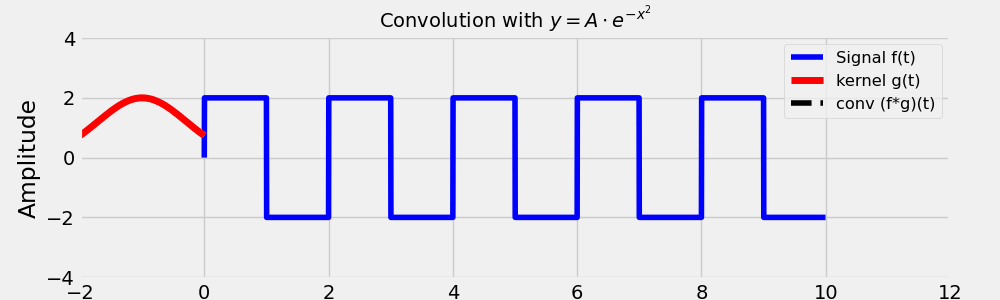

In [159]:
create_single_plot_conv(
    kernel_exp_func, 
    "exp_conv.gif", 
    r"$y = A \cdot e^{-x^2}$"
)


Generation linear_conv_en.gif...


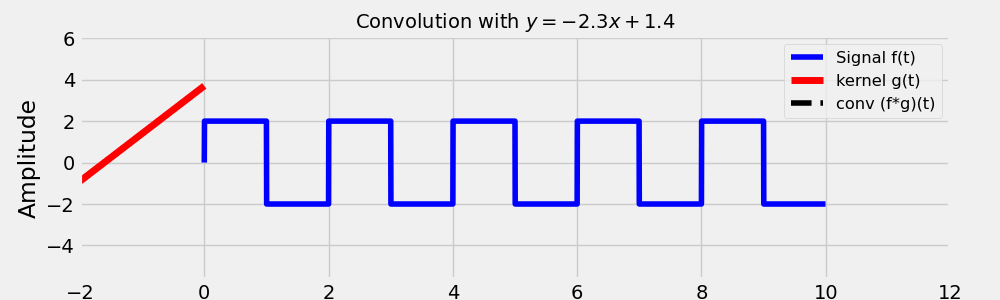

In [160]:
create_single_plot_conv(
    kernel_linear_func, 
    "linear_conv_en.gif", 
    f"$y = {k}x + {b}$"
)

## <a id='toc1_2_'></a>[Task2](#toc0_)

Чтобы разобраться в алгоритме свертки двух сигналов – реализуйте свой собственный алгоритм, осуществляющий свертку сигнала с произвольным ядром.

In [8]:
from numpy.lib.stride_tricks import sliding_window_view

def my_convolve(a : np.ndarray, v : np.ndarray, mode : str = 'full'):
    """
    Returns the discrete, linear convolution of two one-dimensional sequences.
    a : (N,) array_like
        First one-dimensional input array.
    v : (M,) array_like
        Second one-dimensional input array.
    mode {‘full’, ‘valid’, ‘same’}, optional
        ‘full’:By default, mode is ‘full’. This returns the convolution at each point of overlap,
        with an output shape of (N+M-1,). At the end-points of the convolution,
        the signals do not overlap completely, and boundary effects may be seen.
    ‘same’: Mode ‘same’ returns output of length max(M, N). Boundary effects are still visible.
    ‘valid’:Mode ‘valid’ returns output of length max(M, N) - min(M, N) + 1. 
        The convolution product is only given for points where the signals overlap completely. 
        Values outside the signal boundary have no effect.
    
    see more at https://numpy.org/devdocs/reference/generated/numpy.convolve.html
    """
    mode = mode.strip().lower()
    a = np.asarray(a)
    v = np.asarray(v)
    
    if a.ndim != 1 or v.ndim != 1 :
        raise ValueError(f"Invalid array dimensions. \
        Expected one-dimensional sequences, but got arrays with ndim={a.ndim} and ndim={v.ndim}.")
    
    match mode:
        case 'full':
            a = np.pad(a, (len(v)-1,), mode = 'constant', constant_values=0)
            windows = sliding_window_view(a, window_shape=len(v))
            return np.sum(windows * v[::-1], axis=1)
            
        case 'same':
            a_padded = np.pad(a, (len(v) - 1, len(v) - 1), mode='constant')
            windows = sliding_window_view(a_padded, window_shape=len(v))
            full_res = np.sum(windows * v[::-1], axis=1)

            out_size = max(len(a), len(v))

            start = (len(full_res) - out_size) // 2
            end = start + out_size

            return full_res[start:end]
        
        case 'valid':
            windows = sliding_window_view(a, window_shape=v.shape[0])
            return np.sum(windows * v[::-1], axis=1)
        
        case _:
            raise ValueError(f"Invalid mode '{mode}'. Expected one of: 'full', 'same', 'valid'.")

In [9]:
assert np.array_equal(np.convolve([1, 2, 3], [0, 1, 0.5]), my_convolve([1, 2, 3], [0, 1, 0.5]))
assert np.array_equal(np.convolve([1,2,3], [0,1,0.5], 'same'), my_convolve([1,2,3], [0,1,0.5], 'same'))
assert np.array_equal(np.convolve([1,2,3], [0,1,0.5], 'valid'), my_convolve([1,2,3], [0,1,0.5], 'valid'))

## <a id='toc1_3_'></a>[Task3](#toc0_)

Для любого выбранного Вами ядра свертки убедиться, что свертка во временной области эквивалентна умножению в частотной области (теорема о свертке).

In [11]:
t_vals_2 = np.arange(0, 10, dt_1)
signal_y_vals_2 = meandr(t_vals_1)

t_win_2 = np.arange(-1.0, 1.0, dt_1)
kernel_vals_2 = kernel_exp_func(t_win_2)

In [12]:
time_conv = np.convolve(signal_y_vals_2, kernel_vals_2, mode='full') # time domain convolution

In [13]:
n_full = len(signal_y_vals_2) + len (kernel_vals_2) -1

signal_2_fft = np.fft.fft(signal_y_vals_2, n=n_full)
kernel_2_fft = np.fft.fft(kernel_vals_2, n=n_full)

freq_conv = np.fft.ifft(signal_2_fft * kernel_2_fft) # freq domain multiplication
freq_conv = np.real(freq_conv)

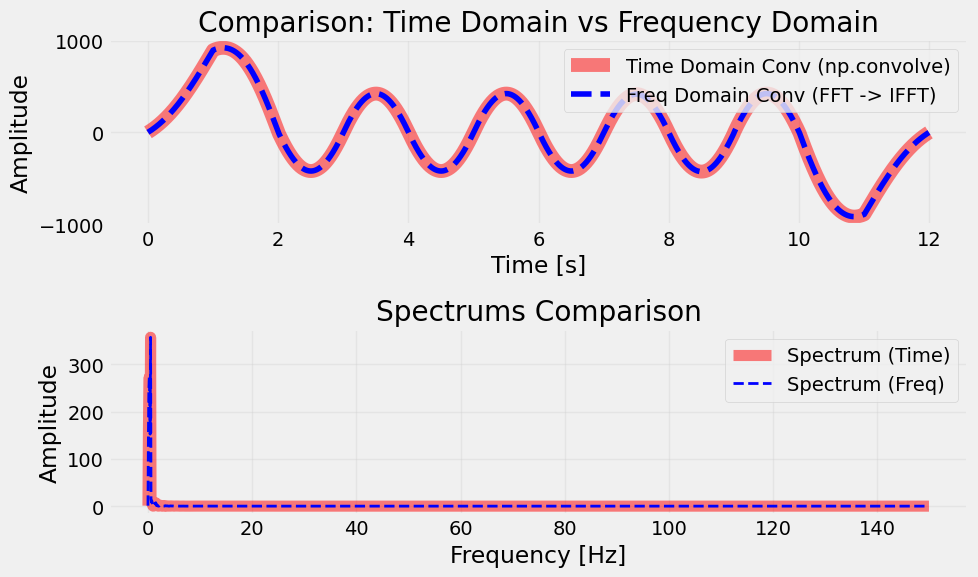

In [14]:
import numpy as np
import matplotlib.pyplot as plt

N_res = len(time_conv)
t_vals_res = np.arange(N_res) * dt_1
freq_res = np.fft.fftfreq(N_res, dt_1)

spectrum_time = np.fft.fft(time_conv)
spectrum_freq = np.fft.fft(freq_conv)

plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
plt.plot(t_vals_res, time_conv, 'r', label='Time Domain Conv (np.convolve)', linewidth=10, alpha=0.5)
plt.plot(t_vals_res, freq_conv, 'b--', label='Freq Domain Conv (FFT -> IFFT)', linewidth=4)

plt.title('Comparison: Time Domain vs Frequency Domain')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.legend()
plt.grid(True, alpha=0.3)


plt.subplot(2, 1, 2)
f_limit = N_res // 2
plt.plot(freq_res[:f_limit], 2/N_res * np.abs(spectrum_time[:f_limit]), 'r', 
         label='Spectrum (Time)', linewidth=8, alpha=0.5)
plt.plot(freq_res[:f_limit], 2/N_res * np.abs(spectrum_freq[:f_limit]), 'b--', 
         label='Spectrum (Freq)', linewidth=2)

plt.title('Spectrums Comparison')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## <a id='toc1_4_'></a>[Task4](#toc0_)

Разобраться в реализации свертки с ядром Гаусса для реализации сглаживающего фильтра во временной области.

In [15]:
def create_gaussian_kernel(sigma):
    radius = int(3 * sigma)
    n = np.arange(-radius, radius + 1)
    kernel = np.exp(-(n**2) / (2 * sigma**2))
    kernel /= np.sum(kernel)    
    return kernel

In [16]:
sigmas = [1.0, 3.0, 7.0]
kernels = [create_gaussian_kernel(sigma) for sigma in sigmas]

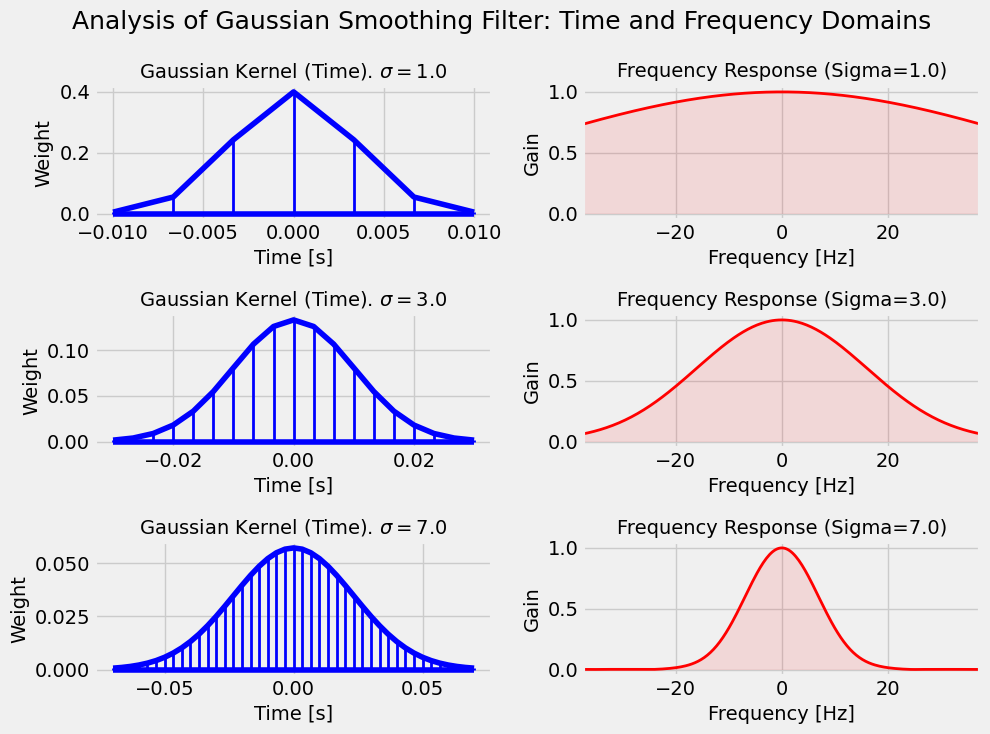

In [17]:
import numpy as np
import matplotlib.pyplot as plt

dt = dt_1
sigmas = [1.0, 3.0, 7.0]
numb_show = len(sigmas)

plt.figure(figsize=(10, 2.5 * numb_show))
plt.suptitle('Analysis of Gaussian Smoothing Filter: Time and Frequency Domains', fontsize=18)

for i, (sigma, kernel) in enumerate(zip(sigmas, kernels)):

    K = len(kernel)
    
    t_kernel = (np.arange(K) - K // 2) * dt
    
    n_fft_smooth = 1024 
    kernel_spectrum = np.fft.fft(kernel, n=n_fft_smooth)
    
    kernel_spectrum_abs = np.abs(kernel_spectrum) 
    
    freq_smooth = np.fft.fftshift(np.fft.fftfreq(n_fft_smooth, dt))
    kernel_spectrum_shifted = np.fft.fftshift(kernel_spectrum_abs)
    
    plt.subplot(numb_show, 2, 2 * i + 1)
    markerline, stemlines, baseline = plt.stem(t_kernel, kernel)
    
    plt.setp(stemlines, color='blue', linewidth=2) 
    plt.setp(markerline, color='red', markersize=0)
    plt.setp(baseline, color='blue')
    
    plt.plot(t_kernel, kernel, 'b')
    
    plt.title(r'Gaussian Kernel (Time). $\sigma =' + f'{sigma}$', fontsize=14)
    plt.xlabel('Time [s]', fontsize=14)
    plt.ylabel('Weight', fontsize=14)

    plt.subplot(numb_show, 2, 2 * i + 2)
    
    f_nyquist = 1 / (2 * dt)
    plt.plot(freq_smooth, kernel_spectrum_shifted, 'r', linewidth=2)
    plt.fill_between(freq_smooth, kernel_spectrum_shifted, color='red', alpha=0.1)
    
    plt.title(f'Frequency Response (Sigma={sigma})', fontsize=14)
    plt.xlabel('Frequency [Hz]', fontsize=14)
    plt.xlim(-f_nyquist/4, f_nyquist/4) 
    plt.ylabel('Gain', fontsize=14)

plt.tight_layout()
plt.show()

In [18]:
f_1 = 50.0
f_2 = 150.0
f_3 = 450.0

Fs = 2000 
dt_4 = 1.0 / Fs

w_1 = 2 * np.pi * f_1
w_2 = 2 * np.pi * f_2
w_3 = 2 * np.pi * f_3

signal_4 = lambda t : np.cos(w_1 * t) + np.cos(w_2 * t) + np.cos(w_3 * t)

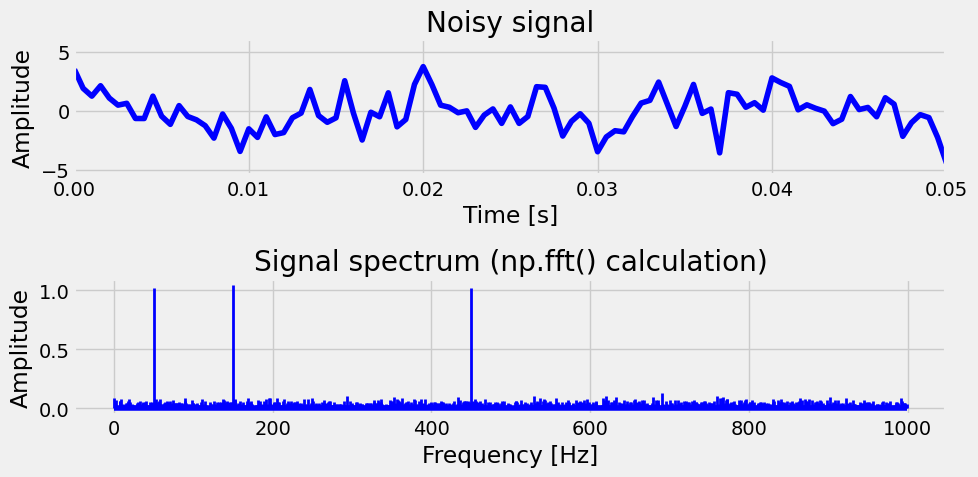

In [21]:
t_vals = np.arange(0, 1, dt_4)
signal_vals = signal_4(t_vals)

np.random.seed(42)
N = signal_vals.shape[-1]
signal_vals_noise = signal_vals + np.random.normal(0, 1, N)

spectrum_noisy_fft = np.fft.fft(signal_vals_noise)

N = signal_vals_noise.shape[-1]

freq = np.fft.fftfreq(N, dt_4)

plt.figure(figsize=(10, 5))

plt.subplot(2, 1, 1)
plt.plot(t_vals, signal_vals_noise, 'b')
plt.title('Noisy signal')
plt.xlabel('Time [s]')
plt.xlim(0, 0.05)
plt.ylabel('Amplitude')

plt.subplot(2, 1, 2)
markerline, stemlines, baseline = plt.stem(freq[:N//2], 2/N * np.abs(spectrum_noisy_fft[:N//2]))

plt.setp(stemlines, color='blue', linewidth=2) 
plt.setp(markerline, color='red', markersize=0)
plt.setp(baseline, color='blue')

plt.title('Signal spectrum (np.fft() calculation)')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()

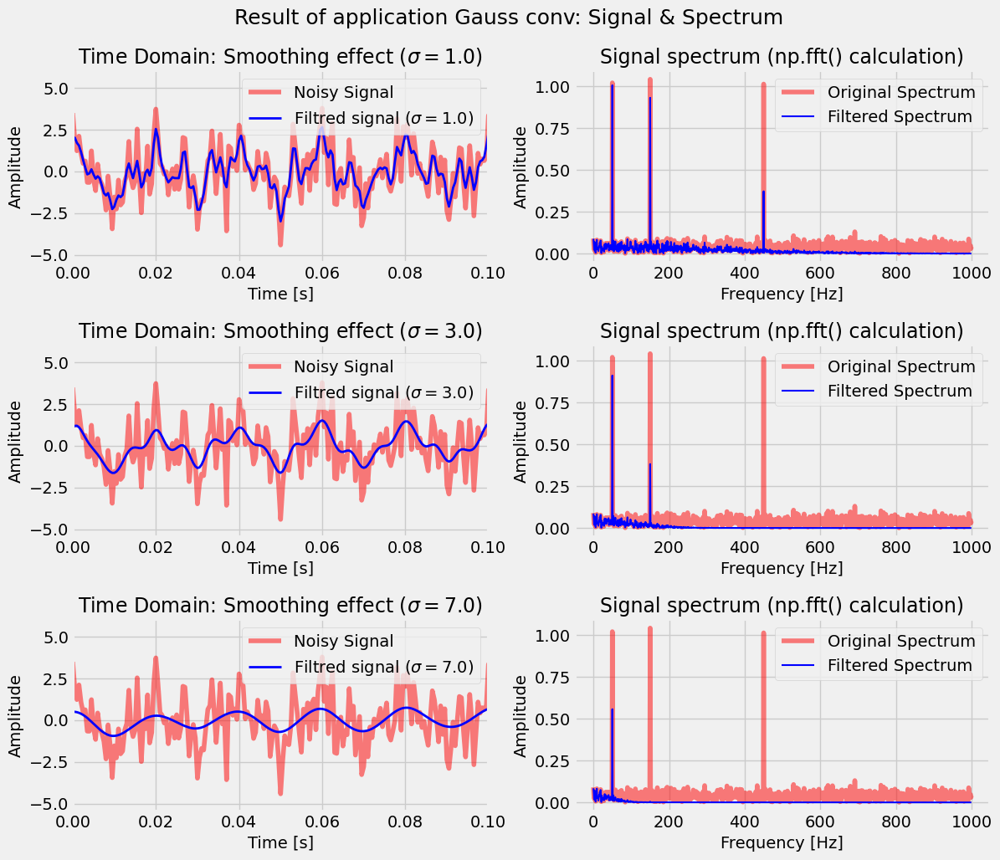

In [22]:
plt.figure(figsize=(12, 3.5 * numb_show))
plt.suptitle('Result of application Gauss conv: Signal & Spectrum', fontsize=18)

for i, (sigma, kernel) in enumerate(zip(sigmas, kernels)):
    smoothed_signal = my_convolve(signal_vals_noise, kernel, mode='same')
    
    N = len(signal_vals_noise)
    freq = np.fft.fftfreq(N, dt_4)
    orig_fft = np.abs(np.fft.fft(signal_vals_noise)) * 2 / N
    filt_fft = np.abs(np.fft.fft(smoothed_signal)) * 2 / N
    half = N // 2
    
    plt.subplot(numb_show, 2, 2 * i + 1)
    plt.plot(t_vals, signal_vals_noise, 'r', alpha=0.5, label='Noisy Signal')
    
    plt.plot(t_vals, smoothed_signal, 'b', linewidth=2, label=rf'Filtred signal ($\sigma={sigma}$)')
    plt.title(rf'Time Domain: Smoothing effect ($\sigma={sigma}$)', fontsize=17)
    
    plt.xlabel('Time [s]', fontsize=14)
    plt.ylabel('Amplitude', fontsize=14)
    plt.legend(loc='upper right')
    plt.xlim(0, 0.1)

    plt.subplot(numb_show, 2, 2 * i + 2)
    plt.plot(freq[:half], orig_fft[:half], 'r', alpha=0.5, label='Original Spectrum')
    plt.plot(freq[:half], filt_fft[:half], 'b', linewidth=1.5, label='Filtered Spectrum')
    
    plt.title('Signal spectrum (np.fft() calculation)', fontsize=17)
    plt.xlabel('Frequency [Hz]', fontsize=14)
    plt.ylabel('Amplitude', fontsize=14)
    plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

## <a id='toc1_5_'></a>[Task5](#toc0_)

Реализовать пункт (4) в частотной области. Убедиться, что результаты совпадают. Настройте параметры ядра Гаусса таким образом, чтобы реализовать:
(а) узкополосной фильтр
(б) фильтр нижних частот

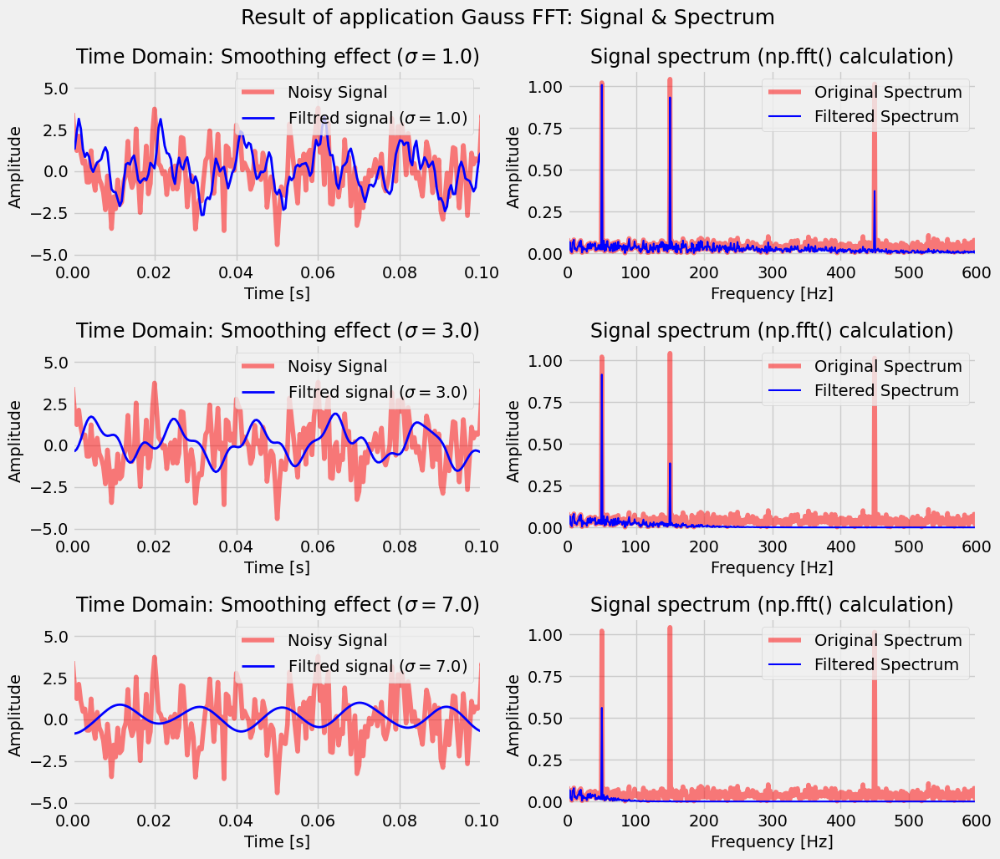

In [23]:
plt.figure(figsize=(12, 3.5 * numb_show))
plt.suptitle('Result of application Gauss FFT: Signal & Spectrum', fontsize=18)

for i, (sigma, kernel) in enumerate(zip(sigmas, kernels)):
    N = len(signal_vals_noise)
    
    signal_fft = np.fft.fft(signal_vals_noise)

    kernel_fft = np.fft.fft(kernel, n=N)

    filtered_fft = signal_fft * kernel_fft

    smoothed_signal = np.fft.fftshift(np.fft.ifft(filtered_fft).real)
    
    freq = np.fft.fftfreq(N, dt_4)
    orig_fft = np.abs(signal_fft) * 2 / N
    filt_fft = np.abs(filtered_fft) * 2 / N
    half = N // 2
    
    plt.subplot(numb_show, 2, 2 * i + 1)
    plt.plot(t_vals, signal_vals_noise, 'r', alpha=0.5, label='Noisy Signal')
    plt.plot(t_vals, smoothed_signal, 'b', linewidth=2, label=rf'Filtred signal ($\sigma={sigma}$)')
    
    plt.title(rf'Time Domain: Smoothing effect ($\sigma={sigma}$)', fontsize=17)
    plt.xlabel('Time [s]', fontsize=14)
    plt.ylabel('Amplitude', fontsize=14)
    plt.legend(loc='upper right')
    plt.xlim(0, 0.1)

    plt.subplot(numb_show, 2, 2 * i + 2)
    plt.plot(freq[:half], orig_fft[:half], 'r', alpha=0.5, label='Original Spectrum')
    plt.plot(freq[:half], filt_fft[:half], 'b', linewidth=1.5, label='Filtered Spectrum')
    
    plt.title('Signal spectrum (np.fft() calculation)', fontsize=17)
    plt.xlabel('Frequency [Hz]', fontsize=14)
    plt.ylabel('Amplitude', fontsize=14)
    plt.legend(loc='upper right')
    plt.xlim(0, 600)

plt.tight_layout()
plt.show()

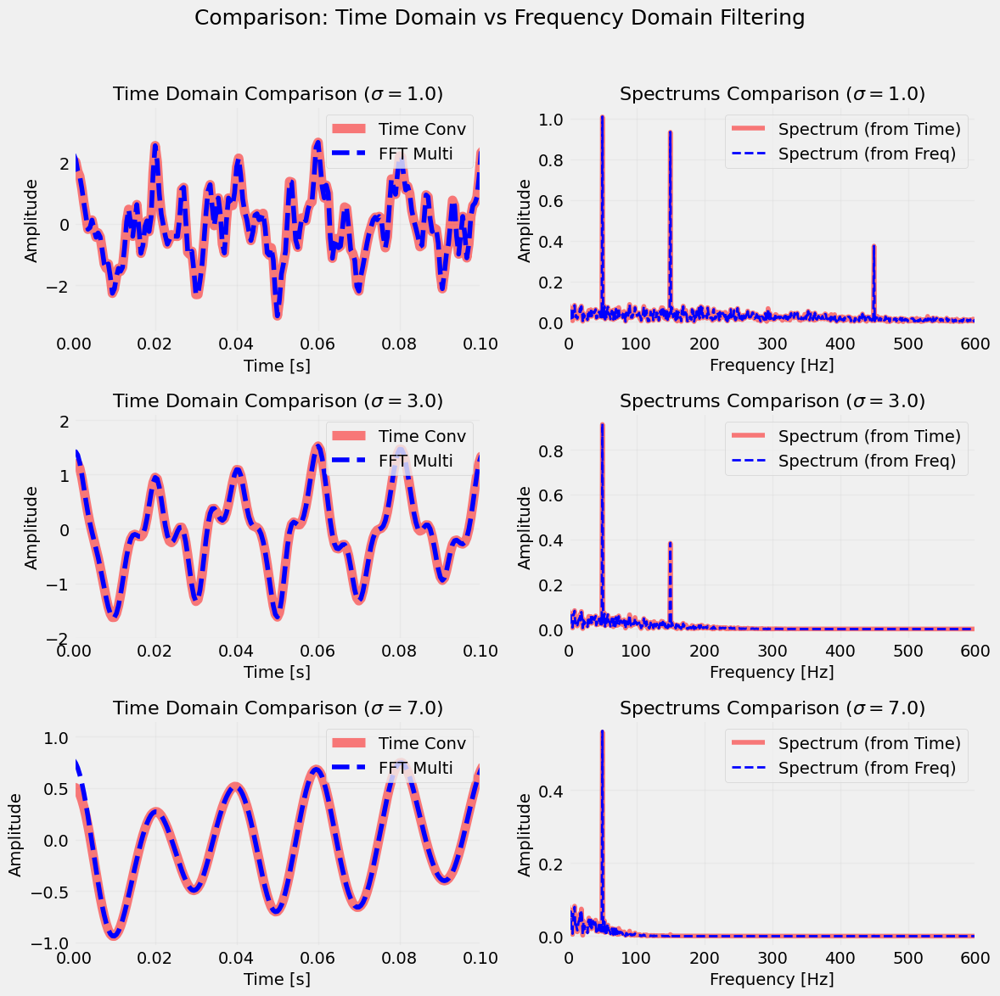

In [295]:
plt.figure(figsize=(12, 4 * numb_show))
plt.suptitle('Comparison: Time Domain vs Frequency Domain Filtering', fontsize=18)

for i, (sigma, kernel) in enumerate(zip(sigmas, kernels)):
    N = len(signal_vals_noise)
    
    smoothed_time = my_convolve(signal_vals_noise, kernel, mode='same')
    fft_from_time = np.abs(np.fft.fft(smoothed_time)) * 2 / N
    
    signal_fft = np.fft.fft(signal_vals_noise)
    kernel_fft = np.fft.fft(kernel, n=N)
    filtered_fft = signal_fft * kernel_fft
    fft_from_freq = np.abs(filtered_fft) * 2 / N
    
    raw_ifft = np.fft.ifft(filtered_fft).real
    smoothed_freq = np.roll(raw_ifft, -(len(kernel) // 2))
    
    freq = np.fft.fftfreq(N, dt_4)
    half = N // 2
    
    plt.subplot(numb_show, 2, 2 * i + 1)
    plt.plot(t_vals, smoothed_time, 'r', linewidth=8, alpha=0.5, label='Time Conv')
    plt.plot(t_vals, smoothed_freq, 'b--', linewidth=4, label='FFT Multi')
    
    plt.title(rf'Time Domain Comparison ($\sigma={sigma}$)', fontsize=16)
    plt.xlabel('Time [s]', fontsize=14)
    plt.ylabel('Amplitude', fontsize=14)
    plt.xlim(0, 0.1)
    plt.legend(loc='upper right')
    plt.grid(True, alpha=0.2)

    plt.subplot(numb_show, 2, 2 * i + 2)
    plt.plot(freq[:half], fft_from_time[:half], 'r', linewidth=4, alpha=0.5, label='Spectrum (from Time)')
    plt.plot(freq[:half], fft_from_freq[:half], 'b--', linewidth=2, label='Spectrum (from Freq)')
    
    plt.title(rf'Spectrums Comparison ($\sigma={sigma}$)', fontsize=16)
    plt.xlabel('Frequency [Hz]', fontsize=14)
    plt.ylabel('Amplitude', fontsize=14)
    plt.xlim(0, 600)
    plt.legend(loc='upper right')
    plt.grid(True, alpha=0.2)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [25]:
f0 = 450.0
idx = idx_sigma_kernel = 2
kernel = kernels[idx]
t_kernel = (np.arange(len(kernel)) - len(kernel) // 2) * dt_4
kernel_bandpass = kernel * np.cos(2 * np.pi * f0 * t_kernel)

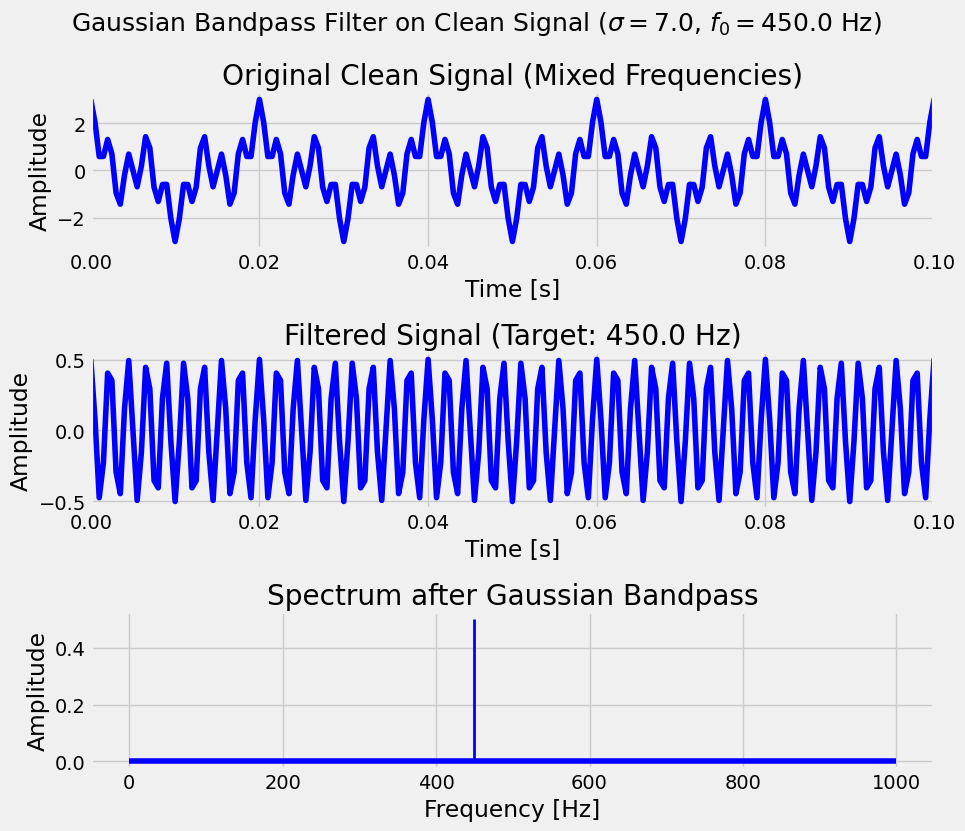

In [26]:
N = len(signal_vals)
spectrum_fft = np.fft.fft(signal_vals)

H_gauss_bp = np.fft.fft(kernel_bandpass, n=N)

filtered_spectrum = H_gauss_bp * spectrum_fft

filtered_signal = np.roll(np.fft.ifft(filtered_spectrum).real, -(len(kernel_bandpass) // 2))

plt.figure(figsize=(10, 8.5))
plt.suptitle(rf'Gaussian Bandpass Filter on Clean Signal ($\sigma={sigmas[idx]}$, $f_0={f0}$ Hz)', fontsize=18)

plt.subplot(3, 1, 1)
plt.plot(t_vals, signal_vals, 'b')
plt.title('Original Clean Signal (Mixed Frequencies)')
plt.xlabel('Time [s]')
plt.xlim(0, 0.1)
plt.ylabel('Amplitude')

plt.subplot(3, 1, 2)
plt.plot(t_vals, filtered_signal, 'b')
plt.title(f'Filtered Signal (Target: {f0} Hz)')
plt.xlabel('Time [s]')
plt.xlim(0, 0.1)
plt.ylabel('Amplitude')

plt.subplot(3, 1, 3)
markerline, stemlines, baseline = plt.stem(freq[:N//2], 2/N * np.abs(filtered_spectrum[:N//2]))
plt.setp(stemlines, color='blue', linewidth=2) 
plt.setp(markerline, color='red', markersize=0)
plt.setp(baseline, color='blue')

plt.title('Spectrum after Gaussian Bandpass')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()

## <a id='toc1_6_'></a>[Task6](#toc0_)

(а) Реализовать полосовой фильтр, используя окно Планка.
**Замечание:** окно Планка описывается уравнением, представленным на соответствующем рисунке в методических указаниях.

![Plank's window formula](images/Plank's_window)

In [27]:
import numpy as np

def planck_taper(N, epsilon=0.1):
    """Plank's window implementation
    The formula is shown in the screenshot above.
    see more at https://www.recordingblogs.com/wiki/planck-taper-window
    """
    a = np.ones(N)
    
    eps_N = epsilon * (N - 1)
    one_minus_eps_N = (1 - epsilon) * (N - 1)
    
    for k in range(N):
        if k == 0 or k == N - 1:
            a[k] = 0
            
        elif 0 < k < eps_N:
            z_a = eps_N * (1/k + 1/(k - eps_N))
            a[k] = 1.0 / (np.exp(z_a) + 1)
            
        elif one_minus_eps_N < k < N - 1:
            z_b = eps_N * (1/(N - 1 - k) + 1/(one_minus_eps_N - k))
            a[k] = 1.0 / (np.exp(z_b) + 1)
    return a

## <a id='toc1_7_'></a>[Task7](#toc0_)

(б) Сравнить результат фильтрации зашумленного сигнала при использовании ядра Гаусса и окна Планка. 

Результат работы программы должен соответствовать представленному на Рис. 7.

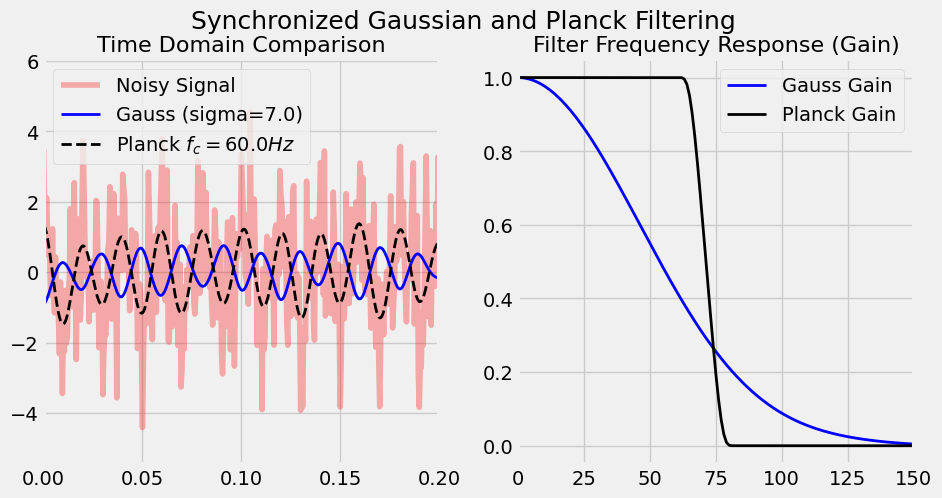

In [47]:
idx = idx_sigma_kernel = 2
kernel_gauss = kernels[idx]

f_c = 60.0  

H_gauss = np.abs(np.fft.fft(kernel_gauss, n=N))
H_gauss /= np.max(H_gauss)

H_planck = np.zeros(N)
k_cutoff = np.argmin(np.abs(freq[:half] - cutoff_hz))

epsilon_p = 0.4 
taper_size = int(k_cutoff * epsilon_p)
taper = planck_taper(taper_size * 2, epsilon=0.5)[taper_size:]

H_planck[:k_cutoff] = 1.0
H_planck[k_cutoff : k_cutoff + taper_size] = taper
H_planck[-k_cutoff:] = 1.0 

sig_fft = np.fft.fft(signal_vals_noise)
res_gauss = np.roll(np.fft.ifft(sig_fft * H_gauss).real, -(len(kernel_gauss) // 2))
res_planck = np.fft.ifft(sig_fft * H_planck).real

plt.figure(figsize=(10, 5))
plt.suptitle('Synchronized Gaussian and Planck Filtering', fontsize=18)

plt.subplot(1, 2, 1)
plt.plot(t_vals, signal_vals_noise, 'r', alpha=0.3, label='Noisy Signal')
plt.plot(t_vals, res_gauss, 'b', linewidth=2, label=f'Gauss (sigma={sigmas[idx]})')
plt.plot(t_vals, res_planck, 'k--', linewidth=2, label=f'Planck $f_c ={f_c} Hz$')
plt.title('Time Domain Comparison', fontsize=16)
plt.xlim(0, 0.2)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(freq[:half], H_gauss[:half], 'b', linewidth=2, label='Gauss Gain')
plt.plot(freq[:half], H_planck[:half], 'k', linewidth=2, label='Planck Gain')
plt.title('Filter Frequency Response (Gain)', fontsize=16)
plt.xlim(0, 150)
plt.legend()
plt.show()